# Calibrate Mono fish-eye camera

## With this code, 
- We get a calibration file like [KITTI dataset](https://www.cvlibs.net/datasets/kitti/).

    - [calibration_file](./output/fisheye_calib_params.txt)

- We can undistort fisheye images using those parameters.

    <img src="./resources/fisheye_calib_res01.png" width="600">

- We can detect camera positions to reconstruct 3D points.

    <img src="./output/fisheye_calib_camera_poses.png" width="300">

## Preparation
1. Measure the charuco board square size.
2. Caputre 20 ro more charuco board images.

## This code steps
1. Set charuco board parameters
2. Load images
3. Get matching points with world space and image space
4. Corner Matching
5. Calibration
    - Estimate camera parameters(K, D), and camera pose matrix(R_list, t_list).
    - Estimate new camera parameter(K) to undistort images
    - Calculate rectification map

## Device
- I used this fish-eye camera.<br>
<img src="./resources/my_fish_eye_camera.png" width="600">

In [1]:
from glob import glob
import numpy as np
import sys, os, cv2, inspect
import matplotlib.pyplot as plt

## 1. User Settings : Charuco board parameters
- I used a charuco board on our display to calibrate a fish-eye image

     <img src="./board/charuco_15.0_inch_7x4_39.33_mm.png" width="600">

- To detect corners with open-cv, we need to create a charuco board object.

In [2]:
# Board Settings
real_square_size_m = 39.33/1000.0 # [m] Measure real size.
real_marker_size_m = real_square_size_m * 0.75 # The same setting when I created the charuco image.
square_num_x = 7   # odd number of squares along the x-axis
square_num_y = 4   # even number of squares along the y-axis

# Chessboard configuration
aruco_dict = cv2.aruco.getPredefinedDictionary(cv2.aruco.DICT_4X4_250)
     
# Create boadr instance
board = cv2.aruco.CharucoBoard((square_num_x, square_num_y), real_square_size_m, real_marker_size_m, aruco_dict)

# Get corner points in world space
charuco_world_points = board.getChessboardCorners()
charuco_world_points_num = charuco_world_points.shape[0]

# Check the result
print(f'charuco_world_points: size = {charuco_world_points.shape} \n')
print(f'type = {type(charuco_world_points)} \n')
print(f'corner xyz in world space \n {charuco_world_points[:5]}')
print(f'charuco_world_points_num = {charuco_world_points_num}')

charuco_world_points: size = (18, 3) 

type = <class 'numpy.ndarray'> 

corner xyz in world space 
 [[0.03933    0.03933    0.        ]
 [0.07866    0.03933    0.        ]
 [0.11798999 0.03933    0.        ]
 [0.15732    0.03933    0.        ]
 [0.19665    0.03933    0.        ]]
charuco_world_points_num = 18


## 2. Load captured image files

In [3]:
# get image file paths
folder_path_charuco_fish_eye = './calibration/fisheye_1920x1080'
file_paths_charuco_fish_eye = sorted(glob(folder_path_charuco_fish_eye + '/*.png'))

# check image file 
img = cv2.imread(file_paths_charuco_fish_eye[0])
img_num = len(file_paths_charuco_fish_eye)
img_shape = img.shape
print(f'image num   = {img_num}')
print(f'image shape = {img.shape}')

image num   = 35
image shape = (1080, 1920, 3)


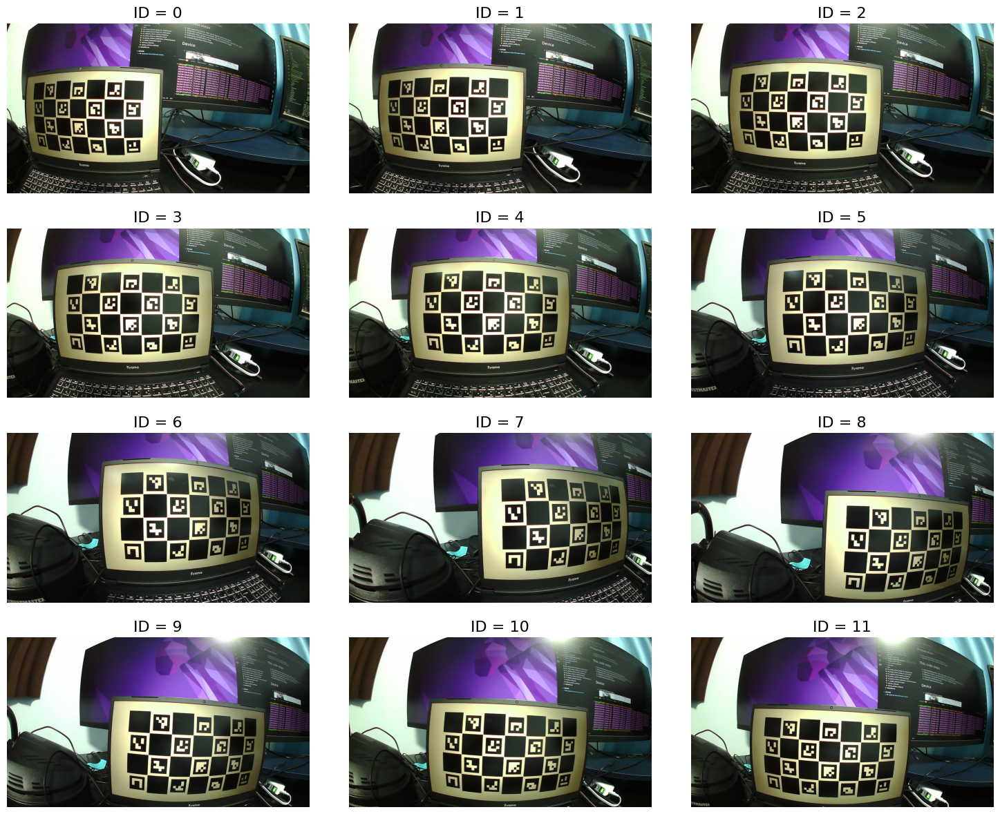

In [4]:
# view all images
view_img_num = 12
cols = 3
rows = view_img_num // cols #(img_num//cols) if (img_num%cols==0) else (img_num//cols + 1)

fig, axs = plt.subplots(rows, cols, figsize=(15,12))
fig.tight_layout()
axs = axs.flat

for i in range(view_img_num):
    img = cv2.imread(file_paths_charuco_fish_eye[i])
    axs[i].imshow(img)
    axs[i].axis('off')
    axs[i].set_title(f'ID = {i}', fontsize=16)

## 3. Get matching points between World space and Image space

In [20]:
# Create conrer detector object 
charuco_params = cv2.aruco.DetectorParameters()
charuco_params.cornerRefinementMethod = cv2.aruco.CORNER_REFINE_CONTOUR
detector = cv2.aruco.CharucoDetector(board, detectorParams=charuco_params)

# We want to get matching points with world space and image space.
charuco_world_points = [] # 3d points in real world.
charuco_img_points  = [] # 2d points in image plane
charuco_img_points_failed = []

img_id_not_found_corners = []
img_id_found_corners = []

use_strict_detection = True

for i, file_path in enumerate(file_paths_charuco_fish_eye):
    # read image
    img = cv2.imread(file_path)
    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # detect corners
    c_corners, c_ids, corners, ids = detector.detectBoard(gray_img)
    
    #--------------------------------------#
    # detection error check-1
    if (c_corners is None):
        print(f'{i:02d} : {file_path}')
        print('----> 1. corners not found.')
        img_id_not_found_corners.append(i)
        charuco_img_points_failed.append([])
        continue
        
    #--------------------------------------#
    # mathc the world and image points
    #   world_point.shape = (N, 1, 3)
    #   img_point.shape = (N, 1, 2)
    world_point, img_point = board.matchImagePoints(c_corners, c_ids)    
    
    #--------------------------------------#
    # detection error check-2
    found_corner_num = len(c_corners)
        
    if (found_corner_num < int(charuco_world_points_num/2)):
        print(f'{i:02d} : {file_path}')
        print(f'----> 2. num of found corners is too low. [{found_corner_num} / {charuco_world_points_num}]')
        img_id_not_found_corners.append(i)
        charuco_img_points_failed.append(img_point)
        continue
        
    #--------------------------------------#        
    # detection error check-3
    if use_strict_detection and (found_corner_num != charuco_world_points_num):
        print(f'{i:02d} : {file_path}')
        print(f'----> 3. some corners not found. [{found_corner_num} / {charuco_world_points_num}]')
        img_id_not_found_corners.append(i)
        charuco_img_points_failed.append(img_point)
        continue
        
    #--------------------------------------#
    # save data
    charuco_world_points.append(world_point)
    charuco_img_points.append(img_point)
    img_id_found_corners.append(i)

23 : ./calibration/fisheye_1920x1080/20250816212133_fisheye.png
----> 3. some corners not found. [14 / 18]


In [21]:
print(f'image num whose corners are found : [{len(img_id_found_corners)} / {len(file_paths_charuco_fish_eye)}]')

image num whose corners are found : [34 / 35]


In [22]:
def plot_board_and_points(ax, file_id, file_path_img, charuco_img_points, corner_ids=None):
    # load image
    img_bgr = cv2.imread(file_path_img)
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    
    # display charuco board image
    ax.imshow(img_rgb)
    
    # display recognized corner points
    if len(charuco_img_points) > 0:
        for i, point in enumerate(charuco_img_points):
            x, y = point.ravel()
            ax.scatter(x, y, c="r", marker="o")
            
            if corner_ids is not None:
                ax.text(x+5, y-5, str(corner_ids[i][0]), color="yellow", fontsize=12)
    
    ax.set_title(f"ID = {file_id} : Found points = {len(charuco_img_points)}")
    ax.axis('off')

## 4. View matching results
### 4.1. Images whose all corner are found

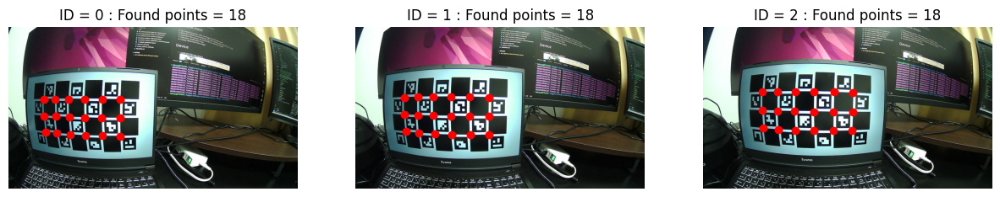

In [23]:
fig, axs = plt.subplots(1,3, figsize=(15,10))
axs = axs.flat
plot_counter = 0

for i, id in enumerate(img_id_found_corners):
    plot_board_and_points(axs[i], id, file_paths_charuco_fish_eye[id], charuco_img_points[i])
    
    if i == 2:
        break

### 4.2. View images whose all corners are **NOT** found
- To use the result of these images, we set like below.
    ```
    use_strict_detection = False
    ```

In [24]:
print(f'use_strict_detection = {use_strict_detection}')

use_strict_detection = True


'\nimg_num_to_show = min(1, len(img_id_not_found_corners))\nfig, axs = plt.subplots(1,img_num_to_show, figsize=(15,5))\n\nif img_num_to_show > 1:\n    axs = axs.flat\nelse:\n    axs = list(axs)\n    \nplot_counter = 0\n\nfor i, id in range(img_id_not_found_corners):\n    id = img_id_not_found_corners\n    plot_board_and_points(axs[i], id, file_paths_charuco_fish_eye[id], charuco_img_points_failed[i])\n    \n    if i == 2:\n        break\n'

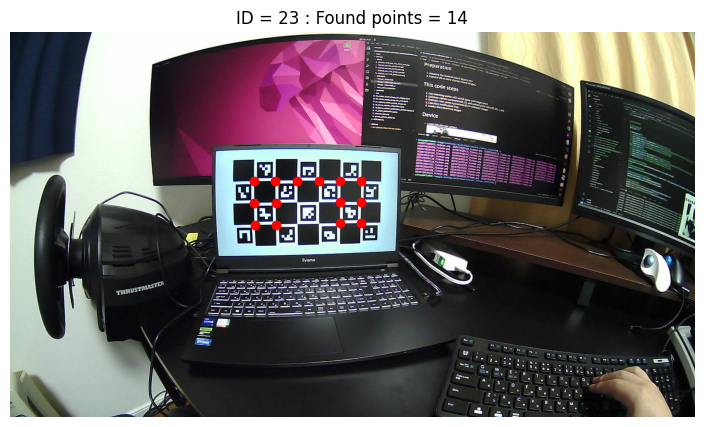

In [ ]:
fig, axs = plt.subplots(1,1, figsize=(10,5))
failed_file_id = 0
id = img_id_not_found_corners[failed_file_id]
file_path_img = file_paths_charuco_fish_eye[id]
plot_board_and_points(axs, id, file_paths_charuco_fish_eye[id], charuco_img_points_failed[failed_file_id])       

In [26]:
# Check Size
print(f'len(charuco_world_points) = {len(charuco_world_points)}')
print(f'charuco_world_points[0].shape = {charuco_world_points[0].shape}')

len(charuco_world_points) = 34
charuco_world_points[0].shape = (18, 1, 3)


## 5. Calibration !

### Variable explanations
- K : Intrinsic Parameter 
    ```
    K  =  │ fx   0   cx │  ← (3×3)
          │  0   fy  cy │
          │  0    0   1 │
    ```
- D : Distotoin coefficient. 
    ```
    [k1, k2, p1, p2, k3]
    ```
- R_list : Rotation matrix from **World** to **Camera** coordinate system
- t_list : The translation vector representing the position of the **World origin** in the **Camera** coordinate system

#### How to use R and t : <br>
$X_{camera} = R_{list}[i] \space X_{world} + t_{list}[i]$

$X_{world} = R_{list}[i]^T \cdot (X_{camera} - t_{list}[i])$

- Camera pose in camera coordinate is $X_{camera} = [0,0,0]^T$.

- So, If we caluclate camera pose in world, 

    $X_{world} = R_{list}[i]^T \cdot ([0,0,0]^T - t_{list}[i]) = - R_{list}[i]^T \cdot t_{list}[i]$

- We draw camera later using this conversion codes.
    ```
    R_world2camera, _ = cv2.Rodrigues(R_list[i])
    t_world2camera    = t_list[i]
    R_camera2world = np.linalg.inv(R_world2camera)
    t_camera2world = - R_camera2world.dot(t_world2camera).reshape((1,3))
    ```

In [27]:
# Set image size
img_height, img_width = img_shape[0], img_shape[1]
img_size = (img_width, img_height)
print(f'img_size = {img_size}')

# Initial params
K = np.zeros((3,3))
D = np.zeros((4,1))

# Calibration flag and criteria for fisheye
flags = cv2.fisheye.CALIB_RECOMPUTE_EXTRINSIC + cv2.fisheye.CALIB_CHECK_COND + cv2.fisheye.CALIB_FIX_SKEW

# Calibrate
rms, K, D, R_list, t_list = cv2.fisheye.calibrate(
    charuco_world_points,
    charuco_img_points,
    img_size,
    K, D, None, None, 
    flags,
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 1e-6)
)

# Estimate a new camera matrix after distortion correction
#   balance = 0.0 → crop all black borders (narrow FOV)
#   balance = 1.0 → keep full FOV (may contain black borders)
balance = 0.0
new_K = cv2.fisheye.estimateNewCameraMatrixForUndistortRectify(
    K, D, img_size, np.eye(3), balance=balance
)

# Create undistortion and rectification maps
d_map1, d_map2 = cv2.fisheye.initUndistortRectifyMap(
    K, D, R=np.eye(3), P=new_K,
    size=img_size,
    m1type=cv2.CV_16SC2
)

img_size = (1920, 1080)


## 6. Calibration Results.

### 6.1. Check Reprojection Error
| Reprojection Error | Grade | Description |
| --- | --- | --- |
|  ~ 0.5 | Very good | For production-level systems |
| 0.5 ~ 1.0 | Good | Suitable for general-purpose applications |
| > 1.0 | Bad | Input images or calibration logic must be improved |

In [28]:
print(f'Reprojection Error = {rms: .4f}')

Reprojection Error =  0.2036


### 6.2. Get Distortion-free images

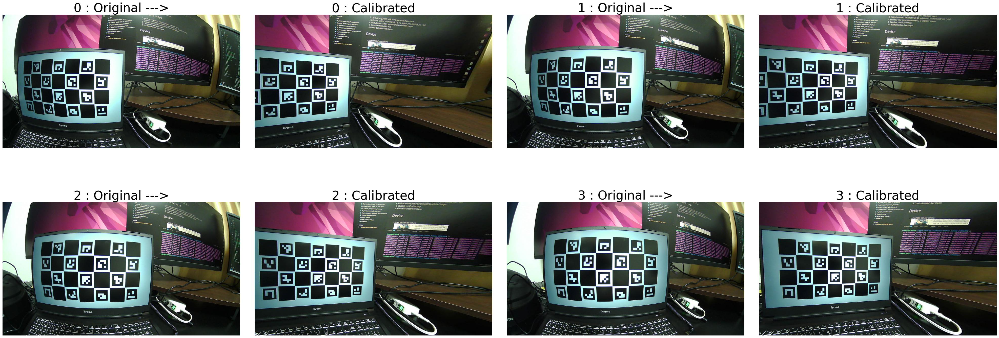

In [29]:
font_size = 35
view_image_num = 4
cols = 4
rows = (view_image_num*2 // cols) if (view_image_num*2 %cols==0) else (imview_image_numg_num*2 // cols + 1)
fig, axs = plt.subplots(rows, cols, figsize=(40,15))
fig.tight_layout()
axs = axs.flat

for i, file_path in enumerate(file_paths_charuco_fish_eye):
    img_ori = cv2.imread(file_path)
    img_ori = cv2.cvtColor(img_ori, cv2.COLOR_BGR2RGB)
    img_new = cv2.remap(img_ori, d_map1, d_map2, interpolation=cv2.INTER_LINEAR)
    #
    axs[2*i].imshow(img_ori)
    axs[2*i].axis('off')
    axs[2*i+1].imshow(img_new)
    axs[2*i+1].axis('off')
    
    # set title
    axs[2*i].set_title(f'{i} : Original --->', fontsize=font_size)
    axs[2*i+1].set_title(f'{i} : Calibrated', fontsize=font_size)
    
    if i == view_image_num-1:
        break
    

### 6.3. Test calibration with other images
- We caliculated distortion map(d_map1 and d_map2).
- Now we use it to calibrate other images.

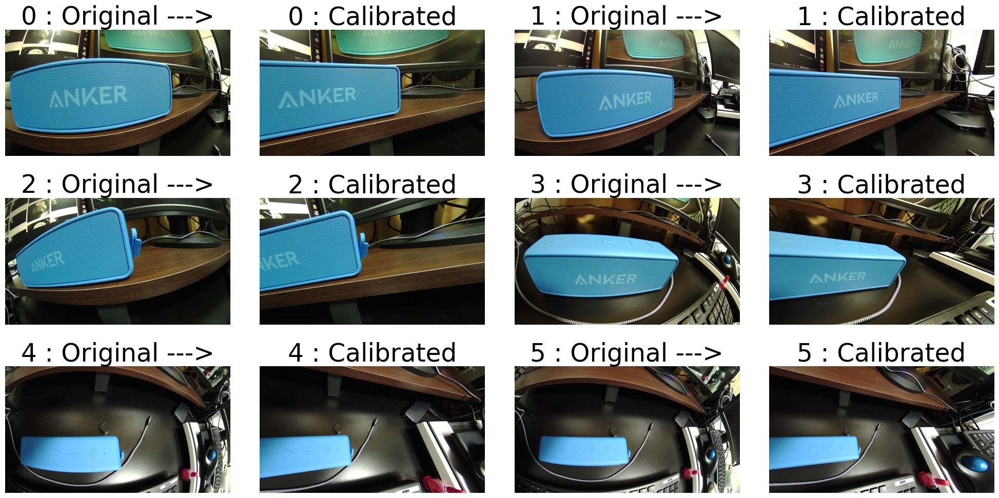

In [30]:
folder_path_others = './test/fisheye_1920x1080'
file_paths_others = sorted(glob(folder_path_others + '/*.png'))
img_num = len(file_paths_others)
font_size = 35
cols = 4
rows = (img_num*2 // cols) if (img_num*2 %cols==0) else (img_num*2 // cols + 1)
fig, axs = plt.subplots(rows, cols, figsize=(20,10))
fig.tight_layout()
axs = axs.flat

for i, file_path in enumerate(file_paths_others):
    img_ori = cv2.imread(file_path)
    img_ori = cv2.cvtColor(img_ori, cv2.COLOR_BGR2RGB)
    img_new = cv2.remap(img_ori, d_map1, d_map2, interpolation=cv2.INTER_LINEAR)
    #
    axs[2*i].imshow(img_ori)
    axs[2*i].axis('off')
    axs[2*i+1].imshow(img_new)
    axs[2*i+1].axis('off')
    
    # set title
    axs[2*i].set_title(f'{i} : Original --->', fontsize=font_size)
    axs[2*i+1].set_title(f'{i} : Calibrated', fontsize=font_size)    

### 6.4. Create a Calibration File like KITTI
- Calibration files of KITTI are created for multi-sensors.
- However, in this case, there is only one camera. So,
    - T00 = np.zeros((3,1))
    - R00 = np.eye(3)

In [31]:
from stereo_camera_utility import create_csv_line
from datetime import datetime
from pprint import pprint

# Set KITTI like variables
S_00 = np.array(list(img_size))
K_00 = new_K
D_00 = D
R_00 = np.eye(3)
T_00 = np.zeros((3,1))

# create string lines for csv
lines = []

# Info
lines.append(datetime.now().strftime("calib_time: %d-%b-%Y %H:%M:%S"))
lines.append(f"corner_dist: {real_square_size_m: .6e}")

# Fisheye camera
lines.append('S_00 : ' + create_csv_line(S_00))
lines.append('K_00 : ' + create_csv_line(K_00))
lines.append('D_00 : ' + create_csv_line(D_00))
lines.append('R_00 : ' + create_csv_line(R_00))        # Camera 0 の基準 → 単位行列
lines.append('T_00 : ' + create_csv_line(T_00))  # Camera 0 自身なので 0

# Write to text file
params_file_name = f'./output/fisheye_calib_params.txt'

with open(params_file_name, 'w') as f:
    for line in lines:
        f.write(line + '\n')

pprint(lines)

['calib_time: 17-Aug-2025 00:05:41',
 'corner_dist:  3.933000e-02',
 'S_00 :  1.920000e+03,  1.080000e+03',
 'K_00 :  6.101097e+02,  0.000000e+00,  7.388212e+02,  0.000000e+00,  '
 '6.100659e+02,  5.449514e+02,  0.000000e+00,  0.000000e+00,  1.000000e+00',
 'D_00 : -1.949178e-02, -8.042911e-03,  5.873380e-03, -2.090744e-03',
 'R_00 :  1.000000e+00,  0.000000e+00,  0.000000e+00,  0.000000e+00,  '
 '1.000000e+00,  0.000000e+00,  0.000000e+00,  0.000000e+00,  1.000000e+00',
 'T_00 :  0.000000e+00,  0.000000e+00,  0.000000e+00']


### 6.5. Check All Camera Poses
- Check Extrinsic Parameters => View Camera Position in world space

In [32]:
def plotCamera(ax, rot_mat_c2w, trans_mat_c2w, width=1, height=0.75, focal_length=1, scale=0.5, color=None, camera_id=None):
    # Draw a camera frustum (pyramid shape)
    
    # Define points in camera coordinate system
    points_on_camera = np.array((
        [0,0,0], # Origin
        [width/2, height/2, focal_length],    # Front square point 1
        [width/2, -height/2, focal_length],   # Front square point 2
        [-width/2, -height/2, focal_length],  # Front square point 3
        [-width/2, height/2, focal_length],   # Front square point 4
    ))
    
    # Transform points to world coordinate system
    trans_mat_c2w = trans_mat_c2w.reshape((3,1))
    points_on_world = (scale * rot_mat_c2w @ points_on_camera.T + trans_mat_c2w).T
    
    # print(f"points_on_world[0] = {points_on_world[0]}")
    
    # Lines from Origin to Front square corners
    lines = []
    for point in points_on_world:
        lines.append(np.array([points_on_world[0], point]))
        
    # Front square lines
    points_square = []
    for i in range(4):
        points_square.append(points_on_world[i+1])
        
    points_square.append(points_on_world[1]) # Close the square
    lines_square = np.array(points_square)
    
    # Draw lines from Origin
    for line in lines:
        ax.plot(line[:, 0], line[:, 1], line[:, 2], "-", color=color)
    
    # Draw lines of Square
    ax.plot(lines_square[:, 0], lines_square[:, 1], lines_square[:, 2], "-", color=color)
    
    # Plot camera pos
    # ax.plot(points_on_world[0][0], points_on_world[0][1], points_on_world[0][2], "r.")
    
    # Plot ID
    if camera_id is not None:
        ax.text(points_on_world[0][0], points_on_world[0][1], points_on_world[0][2], f"{camera_id}", fontsize=12)
    

In [33]:
def plot_world_points(ax, world_points):
    # world_points.shape = [N, 1, 3]
    print(world_point.shape)
    ax.plot(world_points[:,:,0], world_points[:,:,1], world_points[:,:,2], ".")
    
    # Plot Origin
    ax.plot(0.0, 0.0, 0.0, "ro")

(18, 1, 3)


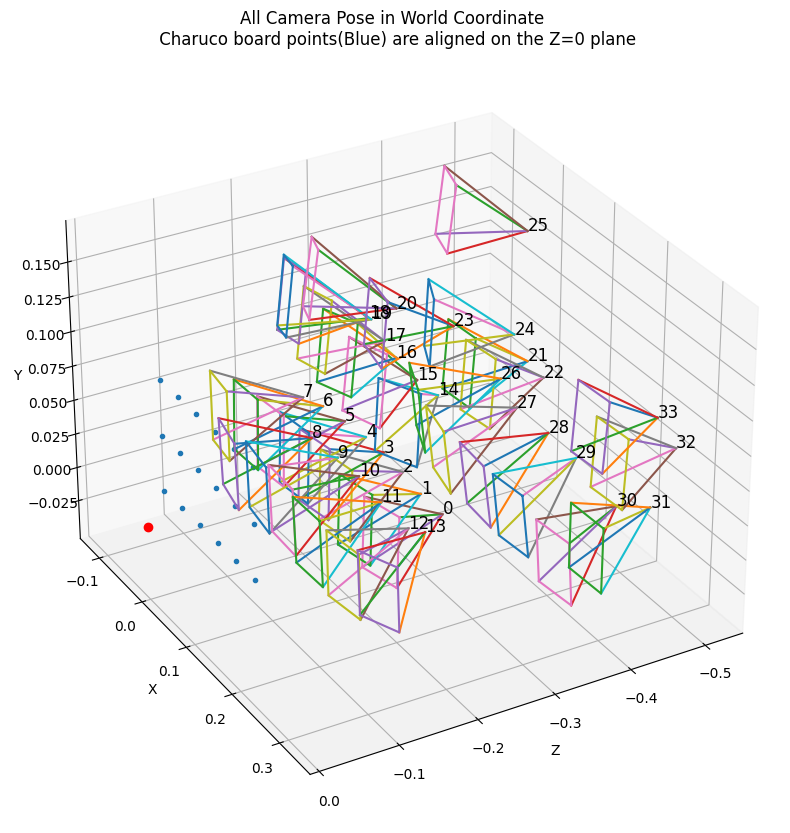

In [34]:
from mpl_toolkits.mplot3d import Axes3D  # 必要

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
ax.view_init(elev=None, azim=60, vertical_axis="y")
ax.set_title('All Camera Pose in World Coordinate \n Charuco board points(Blue) are aligned on the Z=0 plane')
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
plot_world_points(ax, charuco_world_points[0])

for i in range(len(R_list)):
    R_world2camera, _ = cv2.Rodrigues(R_list[i])
    t_world2camera    = t_list[i]
    R_camera2world = np.linalg.inv(R_world2camera)
    t_camera2world = - R_camera2world.dot(t_world2camera).reshape((1,3))

    plotCamera(ax, R_camera2world, t_camera2world, width=0.1, height=0.1, focal_length=0.2, scale=0.5, camera_id=i)
    
folder_path_save = './output'
os.makedirs(folder_path_save, exist_ok=True)
file_path_save = f'{folder_path_save}/fisheye_calib_camera_poses.png'
plt.savefig(f'{file_path_save}')